# Xarray - Examples

In [1]:
import xarray as xr
import numpy as np

In [2]:
mvbs = xr.open_dataset("./python_plotting_files/mvbs.nc")
mvbs

<xarray.Dataset> Size: 6MB
Dimensions:            (channel: 4, ping_time: 546, depth: 370)
Coordinates:
  * ping_time          (ping_time) datetime64[ns] 4kB 2018-03-08T17:37:50 ......
  * channel            (channel) <U37 592B 'GPT  18 kHz 00907206dc7f 1-1 ES18...
  * depth              (depth) float64 3kB 0.0 1.0 2.0 3.0 ... 367.0 368.0 369.0
    distance           (ping_time) float64 4kB ...
Data variables:
    Sv                 (channel, ping_time, depth) float64 6MB ...
    latitude           (ping_time) float64 4kB ...
    longitude          (ping_time) float64 4kB ...
    frequency_nominal  (channel) float64 32B ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.10.0
    processing_time:              2025-04-04T14:28:17Z
    processing_function:          commongrid.compute_MVBS
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

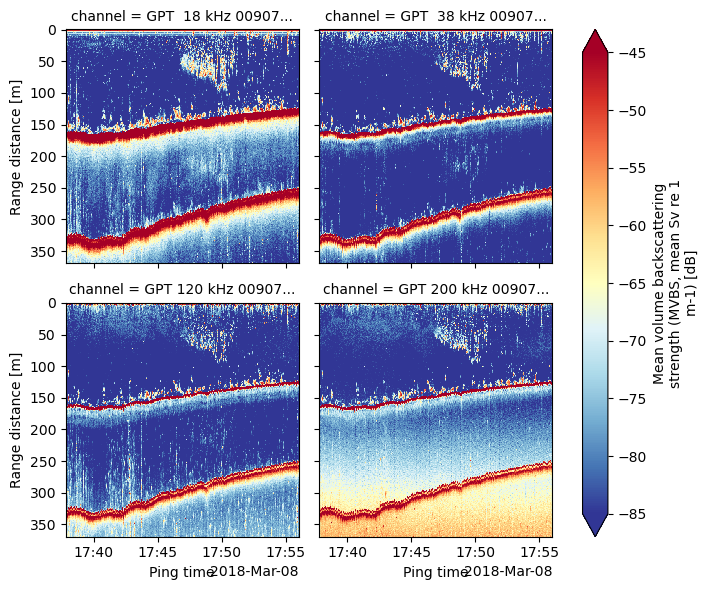

In [3]:
mvbs.Sv.plot(x="ping_time", y="depth", #define axes
             col="channel", #define face or columns
             col_wrap=2,  #how many columns per row
             cmap='RdYlBu_r', #colourmap
             yincrease=False, # increasing or decreasing y axis
             vmin=-85, #colorbar min
             vmax=-45 #colorbar max
            )

Interactive plotting of ´xarray´ datasets is easiest in ´hvplot´

In [4]:
import hvplot.xarray 

In [5]:
mvbs.Sv.hvplot(
    groupby="channel",
    cmap="RdYlBu_r",
    x='ping_time',
    y='depth',
    clim=(-85,-45)).opts(invert_yaxis=True)

:DynamicMap   [channel]
   :Image   [ping_time,depth]   (Mean volume backscattering strength (MVBS, mean Sv re 1 m-1))

## Simple Processing

First we add a linear ´Sv_lin´ to our dataset, to allow for simple operations in linear space:

In [6]:
mvbs = mvbs.assign(Sv_lin = 10**(mvbs.Sv/10))
mvbs

<xarray.Dataset> Size: 13MB
Dimensions:            (channel: 4, ping_time: 546, depth: 370)
Coordinates:
  * ping_time          (ping_time) datetime64[ns] 4kB 2018-03-08T17:37:50 ......
  * channel            (channel) <U37 592B 'GPT  18 kHz 00907206dc7f 1-1 ES18...
  * depth              (depth) float64 3kB 0.0 1.0 2.0 3.0 ... 367.0 368.0 369.0
    distance           (ping_time) float64 4kB ...
Data variables:
    Sv                 (channel, ping_time, depth) float64 6MB -5.398 ... -59.19
    latitude           (ping_time) float64 4kB ...
    longitude          (ping_time) float64 4kB ...
    frequency_nominal  (channel) float64 32B ...
    Sv_lin             (channel, ping_time, depth) float64 6MB 0.2886 ... 1.2...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.10.0
    processing_time:              2025-04-04T14:28:17Z
    processing_function:          commongrid.compute_MVBS
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

### Swap dimensions  

We have ´ping_time´ and ´distance´ that can be used as x axis. In many cases, distance would be preferred, so we swap time for space:

In [7]:
mvbs = mvbs.swap_dims({"ping_time": "distance"})
mvbs

<xarray.Dataset> Size: 13MB
Dimensions:            (channel: 4, distance: 546, depth: 370)
Coordinates:
    ping_time          (distance) datetime64[ns] 4kB 2018-03-08T17:37:50 ... ...
  * channel            (channel) <U37 592B 'GPT  18 kHz 00907206dc7f 1-1 ES18...
  * depth              (depth) float64 3kB 0.0 1.0 2.0 3.0 ... 367.0 368.0 369.0
  * distance           (distance) float64 4kB 0.00475 0.01311 ... 782.3 785.2
Data variables:
    Sv                 (channel, distance, depth) float64 6MB -5.398 ... -59.19
    latitude           (distance) float64 4kB ...
    longitude          (distance) float64 4kB ...
    frequency_nominal  (channel) float64 32B ...
    Sv_lin             (channel, distance, depth) float64 6MB 0.2886 ... 1.20...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.10.0
    processing_time:              2025-04-04T14:28:17Z
    processing_function:          commongrid.compute_MVBS
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

### Rolling mean

We can apply a rolling mean with a specific window size along time/distance and depth/range:

In [8]:
#Define the window sizes
rm = 2 #range / depth size here 2 m
tm = 10 #distance size here 10 m

#we use Sv_lin and want to compute a rolling function, here we select mean
ds_mean = mvbs.Sv_lin.rolling(depth=rm, #we wanth the depth dim to be summarised by rm
                              distance = tm, #we want distance to be summarised y tm
                              center=True).mean(skipna=True) #we want the mean to be computer

# We do a back transformation into log space
ds_mean = 10 * np.log10(ds_mean) 

ds_mean

<xarray.DataArray 'Sv_lin' (channel: 4, distance: 546, depth: 370)> Size: 6MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
    ping_time  (distance) datetime64[ns] 4kB 2018-03-08T17:37:50 ... 2018-03-...
  * channel    (channel) <U37 592B 'GPT  18 kHz 00907206dc7f 1-1 ES18-11' ......
  * depth      (depth) float64 3kB 0.0 1.0 2.0 3.0 ... 366.0 367.0 368.0 369.0
  * distance   (distance) float64 4kB 0.00475 0.01311 0.02889 ... 782.3 785.2

In [9]:
# and we do a nice interactive plot
ds_mean.hvplot(groupby="channel", #grouping element
               cmap="RdYlBu_r", #colormap
               x='distance', #x axis
               y='depth',#y axis
               clim=(-75,-32)).opts(invert_yaxis=True) #colormap limits and inverted y axis

:DynamicMap   [channel]
   :Image   [distance,depth]   (Sv_lin)

We could ignore the tolerance warning or fix it...

In [10]:
import holoviews as hv

hv.config.image_rtol  = 1000

ds_mean.hvplot(groupby="channel",
               cmap="RdYlBu_r",
               x='distance',
               y='depth',
               clim=(-75,-32)).opts(invert_yaxis=True)

:DynamicMap   [channel]
   :Image   [distance,depth]   (Sv_lin)

### Median

We can apply a rolling median with a specific window size along time/distance and depth/range:

In [11]:
rm = 2 #range / depth size here 2 m
tm = 10 #distance size here 10 m

#we use Sv_lin and want to compute a rolling function, here we select median
ds_median = mvbs.Sv_lin.rolling(depth=rm, #we wanth the depth dim to be summarised by rm
                              distance = tm, #we want distance to be summarised y tm
                              center=True).median(skipna=True) #we want the median to be computer

# We do a back transformation into log space
ds_median = 10 * np.log10(ds_median) 

# and we do a nice interactive plot
ds_median.hvplot(groupby="channel", #grouping element
               cmap="RdYlBu_r", #colormap
               x='distance', #x axis
               y='depth',#y axis
               clim=(-75,-32)).opts(invert_yaxis=True) #colormap limits and inverted y axis

:DynamicMap   [channel]
   :Image   [distance,depth]   (Sv_lin)

### Gaussian Blur

Another commonly used alorithm is gaussian blur.  
We import the ´gaussian_filter´ from the ´scipy.ndimage´ package and apply it:

In [12]:
from scipy.ndimage import gaussian_filter

#Gaussian Blur
sigma=3 #sigma parameter
blur = xr.DataArray(
    gaussian_filter(mvbs.Sv_lin, sigma=sigma), #apply gaussian blur to Sv_lin
    coords=[mvbs.channel.values, mvbs.distance.values, mvbs.depth.values],
    dims=["channel","distance","depth"])

#backtransformation into log space
blur = 10 * np.log10(blur)

# and we do a nice interactive plot
blur.hvplot(groupby="channel", #grouping element
               cmap="RdYlBu_r", #colormap
               x='distance', #x axis
               y='depth',#y axis
               clim=(-75,-32)).opts(invert_yaxis=True) #colormap limits and inverted y axis


:DynamicMap   [channel]
   :Image   [distance,depth]   (value)

## The world's most naive and inefficient bottom detection

In [13]:
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d


def get_bottom(sv, data_thresh = -60, bot_thresh = -40, dmax = 200, dmin=50, offset=0.5):
    """
    Bottom detection, as primitive as it gets

    Attributes:
        sv (xarray): MVBS container generated with echopype containing at least Sv values and depth
        data_thresh (integer or float): data threshold in dB
        bot_thresh (integer or float): minimum value to consider bottom in dB
        dmax (integer or float): maximum depth to consider for bottom detection in m
        dmin (integer or float): minimum depth to coonsider for bottom detection in m
        offset (integer or float): offset from detect bottom line in m

    Returns:
        xarray.Dataset containing the detected bottom depth in m
    """
    bb = []
    for ping in sv:
        ping = ping.where((ping > data_thresh) & (ping.depth > dmin) & (ping.depth < dmax))
        peaks, properties = find_peaks(ping, bot_thresh)
        if len(peaks) > 0:
            bmax  = ping[peaks[np.where(properties['peak_heights']==properties['peak_heights'].max())]]
            if bmax > bot_thresh:
                bmax = bmax.assign_coords(depth = bmax.depth - offset)
                bb.append(bmax)
    bot = xr.combine_by_coords(bb)
    bot = bot.assign(bottom=bot.depth)
    bot = bot.swap_dims({"depth": "distance"})
    return(bot)

In [14]:
mvbs = mvbs.assign(blur=blur)
bot = get_bottom(sv=mvbs.blur.isel(channel=1), offset=2, data_thresh=-60, bot_thresh=-30, dmin=100, dmax=400)
bot

<xarray.Dataset> Size: 2kB
Dimensions:    (distance: 41)
Coordinates:
    ping_time  (distance) datetime64[ns] 328B 2018-03-08T17:56:00 ... 2018-03...
    channel    <U37 148B 'GPT  38 kHz 009072057008 2-1 ES38B'
  * distance   (distance) float64 328B 785.2 724.9 677.9 ... 47.68 20.61 17.08
    depth      (distance) float64 328B 124.0 125.0 126.0 ... 162.0 163.0 164.0
Data variables:
    blur       (distance) float64 328B -17.18 -15.46 -14.87 ... -14.81 -13.81
    bottom     (distance) float64 328B 124.0 125.0 126.0 ... 162.0 163.0 164.0

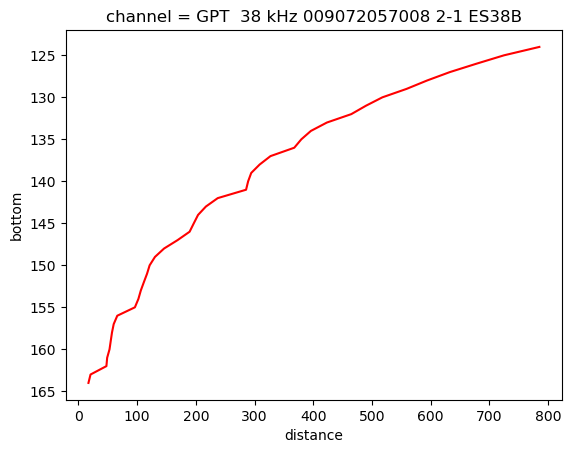

In [18]:
bot.bottom.plot(color='red', yincrease=False)

(200.0, 100.0)

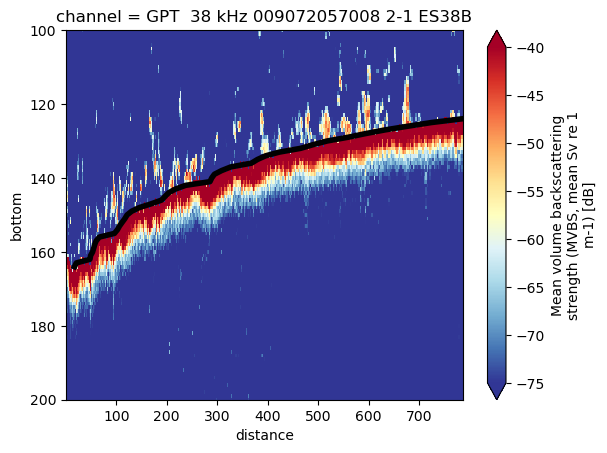

In [16]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
mvbs.isel(channel=1).Sv.plot(x='distance', y='depth', vmin=-75, vmax=-40, yincrease=False, ax=ax, cmap='RdYlBu_r')
bot.bottom.plot.line(c='black', ax=ax, linewidth=4)
plt.ylim([200,100])